In [1]:
#Import dependencies
import numpy as np
import pandas as pd
import sqlite3
import argparse
import json
import pprint
import requests
import sys
import urllib
from urllib.error import HTTPError
from urllib.parse import quote
from urllib.parse import urlencode
%matplotlib inline
import matplotlib.pyplot as plt


In [2]:
#Assign database file to a variable
db_file = "Data/crimedata.db"

#Connect to database file
conn = sqlite3.connect(db_file)



In [3]:
#Query the la crime data table and put into a pandas dataframe
crime_df = pd.read_sql_query("select * from la_crime_1718;", conn)
crime_df.head()

,DRNumber,DateReported,DateOccurred,TimeOccurred,AreaID,AreaName,ReportingDistrict,CrimeCode,CrimeCodeDescription,MOCodes,...,WeaponDescription,StatusCode,StatusDescription,CrimeCode1,CrimeCode2,CrimeCode3,CrimeCode4,Address,CrossStreet,Location
0,170209449,4/22/2017,4/21/2017,1930,2,Rampart,201,510,VEHICLE - STOLEN,,...,,IC,Invest Cont,510,,,,ALEXANDRIA,ROMAINE,"(34.0886, -118.2979)"
1,170206243,2/14/2017,2/11/2017,1700,2,Rampart,275,510,VEHICLE - STOLEN,,...,,IC,Invest Cont,510,,,,OLYMPIC,WESTLAKE,"(34.0512, -118.2787)"
2,170311599,4/25/2017,4/25/2017,745,3,Southwest,325,510,VEHICLE - STOLEN,,...,,IC,Invest Cont,510,,,,VERMONT,ADAMS,"(34.0328, -118.2915)"
3,170408264,4/7/2017,4/7/2017,1,4,Hollenbeck,421,510,VEHICLE - STOLEN,,...,,IC,Invest Cont,510,,,,ALHAMBRA,VALLEY,"(34.0676, -118.2202)"
4,170508584,4/10/2017,4/8/2017,730,5,Harbor,566,510,VEHICLE - STOLEN,,...,,IC,Invest Cont,510,,,,10TH,CENTURY,"(33.7347, -118.2842)"


In [4]:
crime_df['DateOccurred'] = pd.to_datetime(crime_df['DateOccurred'].astype(str), errors='coerce')
crime_df['DateOccurred'] = pd.to_datetime(crime_df['DateOccurred'], format = '%d/%m/%Y %H:%M:%S')

In [5]:
column_2 = crime_df.ix[:,2]

db=pd.DataFrame({"year": column_2.dt.year,
              "month": column_2.dt.month,
              "day": column_2.dt.day,
#               "dayofyear": column_2.dt.dayofyear,
#               "week": column_2.dt.week,
#               "weekofyear": column_2.dt.weekofyear,
              "dayofweek": column_2.dt.dayofweek,
              "quarter": column_2.dt.quarter,
             })

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


In [6]:
dataset1=crime_df.drop('DateOccurred',axis=1)
data1=pd.concat([db,dataset1],axis=1)

In [7]:
data1.dropna(inplace=True)
data1.head()

,year,month,day,dayofweek,quarter,DRNumber,DateReported,TimeOccurred,AreaID,AreaName,...,WeaponDescription,StatusCode,StatusDescription,CrimeCode1,CrimeCode2,CrimeCode3,CrimeCode4,Address,CrossStreet,Location
0,2017,4,21,4,2,170209449,4/22/2017,1930,2,Rampart,...,,IC,Invest Cont,510,,,,ALEXANDRIA,ROMAINE,"(34.0886, -118.2979)"
1,2017,2,11,5,1,170206243,2/14/2017,1700,2,Rampart,...,,IC,Invest Cont,510,,,,OLYMPIC,WESTLAKE,"(34.0512, -118.2787)"
2,2017,4,25,1,2,170311599,4/25/2017,745,3,Southwest,...,,IC,Invest Cont,510,,,,VERMONT,ADAMS,"(34.0328, -118.2915)"
3,2017,4,7,4,2,170408264,4/7/2017,1,4,Hollenbeck,...,,IC,Invest Cont,510,,,,ALHAMBRA,VALLEY,"(34.0676, -118.2202)"
4,2017,4,8,5,2,170508584,4/10/2017,730,5,Harbor,...,,IC,Invest Cont,510,,,,10TH,CENTURY,"(33.7347, -118.2842)"


In [8]:
model_df = data1.drop(['WeaponDescription', 'VictimSex', 'VictimDescent', 'StatusCode', 'StatusDescription',
                         'Address', 'CrossStreet', 'CrimeCode1', 'CrimeCode2', 'CrimeCode3', 'CrimeCode4', 
                       'CrimeCodeDescription', 'PremiseDescription', 'AreaName', 'Location','DateReported',], axis=1)
model_df

,year,month,day,dayofweek,quarter,DRNumber,TimeOccurred,AreaID,ReportingDistrict,CrimeCode,MOCodes,VictimAge,PremiseCode,WeaponUsedCode
0,2017,4,21,4,2,170209449,1930,2,201,510,,16,101,
1,2017,2,11,5,1,170206243,1700,2,275,510,,16,101,
2,2017,4,25,1,2,170311599,745,3,325,510,,16,101,
3,2017,4,7,4,2,170408264,1,4,421,510,,16,101,
4,2017,4,8,5,2,170508584,730,5,566,510,,16,101,
5,2017,3,6,0,1,170706824,2300,7,727,510,,16,101,
6,2017,5,11,3,2,170114037,1700,1,133,510,,16,101,
7,2017,6,6,1,2,170116244,2030,1,138,330,344,29,101,
8,2017,1,26,3,1,170405181,1000,4,497,510,,16,101,
9,2017,2,10,4,1,170206004,300,2,218,510,,16,101,


In [101]:
#model_small_df = model_df.loc[model_df['CrimeCode'].isin(['510','210','420','230','626','740','310','440','330','624'])]
model_small_df = model_df.loc[model_df['CrimeCode'].isin(['510'])]
model_small_df.head()

,year,month,day,dayofweek,quarter,DRNumber,TimeOccurred,AreaID,ReportingDistrict,CrimeCode,MOCodes,VictimAge,PremiseCode,WeaponUsedCode
0,2017,4,21,4,2,170209449,1930,2,201,510,,16,101,
1,2017,2,11,5,1,170206243,1700,2,275,510,,16,101,
2,2017,4,25,1,2,170311599,745,3,325,510,,16,101,
3,2017,4,7,4,2,170408264,1,4,421,510,,16,101,
4,2017,4,8,5,2,170508584,730,5,566,510,,16,101,


In [102]:
model_small_df = model_small_df[['DRNumber', 'TimeOccurred', 'AreaID', 'CrimeCode', 'ReportingDistrict', 'VictimAge', 'PremiseCode', 'WeaponUsedCode', 'MOCodes']]

In [103]:
#model_small_df['year'] = model_small_df['year'].apply(pd.to_numeric, errors='coerce')
#model_small_df['month'] = model_small_df['month'].apply(pd.to_numeric, errors='coerce')
#model_small_df['day'] = model_small_df['day'].apply(pd.to_numeric, errors='coerce')
#model_small_df['dayofweek'] = model_small_df['dayofweek'].apply(pd.to_numeric, errors='coerce')
#model_small_df['quarter'] = model_small_df['quarter'].apply(pd.to_numeric, errors='coerce')
model_small_df['DRNumber'] = model_small_df['DRNumber'].apply(pd.to_numeric, errors='coerce')
model_small_df['TimeOccurred'] = model_small_df['TimeOccurred'].apply(pd.to_numeric, errors='coerce')
model_small_df['AreaID'] = model_small_df['AreaID'].apply(pd.to_numeric, errors='coerce')
model_small_df['CrimeCode'] = model_small_df['CrimeCode'].apply(pd.to_numeric, errors='coerce')
model_small_df['ReportingDistrict'] = model_small_df['ReportingDistrict'].apply(pd.to_numeric, errors='coerce')
model_small_df['VictimAge'] = model_small_df['VictimAge'].apply(pd.to_numeric, errors='coerce')
model_small_df['PremiseCode'] = model_small_df['PremiseCode'].apply(pd.to_numeric, errors='coerce')
model_small_df['WeaponUsedCode'] = model_small_df['WeaponUsedCode'].apply(pd.to_numeric, errors='coerce')
model_small_df['MOCodes'] = model_small_df['MOCodes'].apply(pd.to_numeric, errors='coerce')


In [104]:
model_small_df = model_small_df.fillna(0)
model_small_df.reset_index()
model_small_df.head()

,DRNumber,TimeOccurred,AreaID,CrimeCode,ReportingDistrict,VictimAge,PremiseCode,WeaponUsedCode,MOCodes
0,170209449,1930,2,510,201,16.0,101,0.0,0.0
1,170206243,1700,2,510,275,16.0,101,0.0,0.0
2,170311599,745,3,510,325,16.0,101,0.0,0.0
3,170408264,1,4,510,421,16.0,101,0.0,0.0
4,170508584,730,5,510,566,16.0,101,0.0,0.0


In [105]:
X = model_small_df.drop("PremiseCode", axis=1)
y = model_small_df["PremiseCode"]
print(X.shape, y.shape)

(11412, 8) (11412,)


In [106]:
from sklearn.cross_validation import train_test_split

In [107]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

In [108]:
# Logistic Regreesion

In [109]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression()
classifier

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [110]:
classifier.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [111]:
print(f"Training Data Score: {classifier.score(X_train, y_train)}")
print(f"Testing Data Score: {classifier.score(X_test, y_test)}")

Training Data Score: 0.703236359387779
Testing Data Score: 0.6929547844374343


In [112]:
predictions = classifier.predict(X_test)
print(f"First 10 Predictions:   {predictions[:10]}")
print(f"First 10 Actual labels: {y_test[:10].tolist()}")

First 10 Predictions:   [101 101 101 101 101 101 101 101 101 101]
First 10 Actual labels: [101, 101, 101, 101, 108, 101, 101, 101, 101, 101]


In [113]:
#KNN

In [114]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5000)
knn.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5000, p=2,
           weights='uniform')

In [115]:
knn.score(X_test,y_test)

0.6929547844374343

In [116]:
knn.score(X_train,y_train)

0.703236359387779

k: 1, Train/Test Score: 1.000/0.557
k: 3, Train/Test Score: 0.762/0.647
k: 5, Train/Test Score: 0.729/0.662
k: 7, Train/Test Score: 0.718/0.672
k: 9, Train/Test Score: 0.715/0.681
k: 11, Train/Test Score: 0.711/0.679
k: 13, Train/Test Score: 0.708/0.683
k: 15, Train/Test Score: 0.707/0.685
k: 17, Train/Test Score: 0.708/0.688
k: 19, Train/Test Score: 0.707/0.688


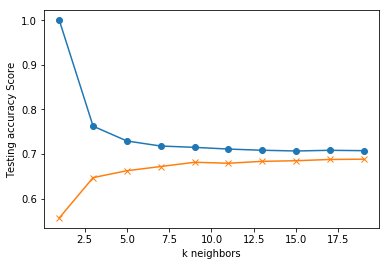

In [117]:
train_scores = []
test_scores = []
for k in range(1, 20, 2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    train_score = knn.score(X_train, y_train)
    test_score = knn.score(X_test, y_test)
    train_scores.append(train_score)
    test_scores.append(test_score)
    print(f"k: {k}, Train/Test Score: {train_score:.3f}/{test_score:.3f}")
    
    
plt.plot(range(1, 20, 2), train_scores, marker='o')
plt.plot(range(1, 20, 2), test_scores, marker="x")
plt.xlabel("k neighbors")
plt.ylabel("Testing accuracy Score")
plt.show()

In [118]:
from sklearn.tree import DecisionTreeClassifier
decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train, y_train)

Y_pred = decision_tree.predict(X_test)

decision_tree = round(decision_tree.score(X_train, y_train) * 100, 2)
print(round(acc_decision_tree,2,), "%")


99.91 %


In [ ]:
#Prediction by Premsie Code and Crime Code 510(VEHICLE - STOLEN)

In [119]:
model_small_df = model_df.loc[model_df['CrimeCode'].isin(['510'])]
model_small_df.head()

,year,month,day,dayofweek,quarter,DRNumber,TimeOccurred,AreaID,ReportingDistrict,CrimeCode,MOCodes,VictimAge,PremiseCode,WeaponUsedCode
0,2017,4,21,4,2,170209449,1930,2,201,510,,16,101,
1,2017,2,11,5,1,170206243,1700,2,275,510,,16,101,
2,2017,4,25,1,2,170311599,745,3,325,510,,16,101,
3,2017,4,7,4,2,170408264,1,4,421,510,,16,101,
4,2017,4,8,5,2,170508584,730,5,566,510,,16,101,


In [120]:
model_small_df = model_small_df[['DRNumber', 'TimeOccurred', 'AreaID', 'CrimeCode', 'ReportingDistrict', 'VictimAge', 'PremiseCode', 'WeaponUsedCode', 'MOCodes']]

In [121]:
#model_small_df['year'] = model_small_df['year'].apply(pd.to_numeric, errors='coerce')
#model_small_df['month'] = model_small_df['month'].apply(pd.to_numeric, errors='coerce')
#model_small_df['day'] = model_small_df['day'].apply(pd.to_numeric, errors='coerce')
#model_small_df['dayofweek'] = model_small_df['dayofweek'].apply(pd.to_numeric, errors='coerce')
#model_small_df['quarter'] = model_small_df['quarter'].apply(pd.to_numeric, errors='coerce')
model_small_df['DRNumber'] = model_small_df['DRNumber'].apply(pd.to_numeric, errors='coerce')
model_small_df['TimeOccurred'] = model_small_df['TimeOccurred'].apply(pd.to_numeric, errors='coerce')
model_small_df['AreaID'] = model_small_df['AreaID'].apply(pd.to_numeric, errors='coerce')
model_small_df['CrimeCode'] = model_small_df['CrimeCode'].apply(pd.to_numeric, errors='coerce')
model_small_df['ReportingDistrict'] = model_small_df['ReportingDistrict'].apply(pd.to_numeric, errors='coerce')
model_small_df['VictimAge'] = model_small_df['VictimAge'].apply(pd.to_numeric, errors='coerce')
model_small_df['PremiseCode'] = model_small_df['PremiseCode'].apply(pd.to_numeric, errors='coerce')
model_small_df['WeaponUsedCode'] = model_small_df['WeaponUsedCode'].apply(pd.to_numeric, errors='coerce')
model_small_df['MOCodes'] = model_small_df['MOCodes'].apply(pd.to_numeric, errors='coerce')


In [147]:
model_small_df = model_small_df.fillna(0)
model_small_df.reset_index()
model_small_df.head(5)

,year,month,day,dayofweek,quarter,DRNumber,TimeOccurred,AreaID,ReportingDistrict,CrimeCode,MOCodes,VictimAge,PremiseCode,WeaponUsedCode
28,2017,1,16,0,1,170104918,820,1,111,624,0.0,46.0,102,308.0
82,2017,2,7,1,1,170100593,1510,1,155,624,0.0,56.0,102,500.0
85,2017,2,11,5,1,170100600,110,1,144,624,0.0,34.0,102,400.0
95,2017,2,15,2,1,170100617,1818,1,162,624,416.0,22.0,502,400.0
103,2017,2,26,6,1,170100640,615,1,182,624,0.0,22.0,301,400.0


In [123]:
X = model_small_df.drop("PremiseCode", axis=1)
y = model_small_df["PremiseCode"]
print(X.shape, y.shape)

(11412, 8) (11412,)


In [124]:
y.unique()

array([101, 108, 123, 707, 103, 208, 104, 158, 710, 301, 106, 121, 142,
       217, 151, 109, 110, 116, 118, 203, 102, 107, 122, 255, 705, 502,
       213, 501, 416, 704, 503, 105, 119, 202])

In [125]:
#Random Forest Classifier

In [126]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=20)
rf = rf.fit(X, y)
rf.score(X, y)

0.9901857693655801

In [130]:
importances = rf.feature_importances_
importances

array([3.91108877e-01, 2.70438815e-01, 2.19838051e-02, 0.00000000e+00,
       3.03271417e-01, 1.26014737e-02, 1.54064910e-04, 4.41546531e-04])

In [ ]:
#Grid Search

In [38]:
from sklearn.model_selection import GridSearchCV
param_grid = {'C': [1, 5, 10, 50]}
grid = GridSearchCV(classifier, param_grid, verbose=3)

In [39]:
grid.fit(X, y)

Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV] C=1 .............................................................
[CV] .................... C=1, score=0.6979057591623037, total=   0.1s
[CV] C=1 .............................................................


/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.
  % (min_groups, self.n_splits)), Warning)
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] .................... C=1, score=0.7011312812417785, total=   0.2s
[CV] C=1 .............................................................
[CV] .................... C=1, score=0.7029807438670536, total=   0.2s
[CV] C=5 .............................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s remaining:    0.0s


[CV] .................... C=5, score=0.6979057591623037, total=   0.1s
[CV] C=5 .............................................................
[CV] .................... C=5, score=0.7011312812417785, total=   0.2s
[CV] C=5 .............................................................
[CV] .................... C=5, score=0.7029807438670536, total=   0.2s
[CV] C=10 ............................................................
[CV] ................... C=10, score=0.6979057591623037, total=   0.1s
[CV] C=10 ............................................................
[CV] ................... C=10, score=0.7011312812417785, total=   0.2s
[CV] C=10 ............................................................
[CV] ................... C=10, score=0.7029807438670536, total=   0.2s
[CV] C=50 ............................................................
[CV] ................... C=50, score=0.6979057591623037, total=   0.1s
[CV] C=50 ............................................................
[CV] .

[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    1.8s finished


GridSearchCV(cv=None, error_score='raise',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'C': [1, 5, 10, 50]}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring=None, verbose=3)

In [40]:
print(grid.best_params_)

{'C': 1}


In [41]:
print(grid.best_score_)

0.7006659656501928


In [42]:
predictions = grid.predict(X)

In [47]:
from sklearn.metrics import classification_report
print(classification_report(y, predictions,
                            target_names=['101', '108', '123', '707', '103', '208', '104', '158', '710', '301', '106',
                                          '121', '142', '217', '151', '109', '110', '116', '118', '203', '102',
                                          '107', '122', '255', '705', '502', '213', '501', '416', '704', '503', '105',
                                          '119', '202']))

             precision    recall  f1-score   support

        101       0.70      1.00      0.82      7996
        108       0.00      0.00      0.00         4
        123       0.00      0.00      0.00       102
        707       0.00      0.00      0.00       445
        103       0.00      0.00      0.00         1
        208       0.00      0.00      0.00         2
        104       0.00      0.00      0.00         1
        158       0.00      0.00      0.00      2110
        710       0.00      0.00      0.00         2
        301       0.00      0.00      0.00         2
        106       0.00      0.00      0.00         4
        121       0.00      0.00      0.00        15
        142       0.00      0.00      0.00         1
        217       0.00      0.00      0.00        21
        151       0.00      0.00      0.00         1
        109       0.00      0.00      0.00       149
        110       0.00      0.00      0.00         2
        116       0.00      0.00      0.00   

/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [ ]:
# Prediction for Premise Code related to CrimeCode 624 (BATTERY - SIMPLE ASSAULT)

In [54]:
model_small_df = model_df.loc[model_df['CrimeCode'].isin(['230'])]
#model_small_df = model_df.loc[model_df['CrimeCode'].isin(['510','210','420','230','626','740','310','440','330','624'])]

In [55]:
model_small_df['DRNumber'] = model_small_df['DRNumber'].apply(pd.to_numeric, errors='coerce')
model_small_df['TimeOccurred'] = model_small_df['TimeOccurred'].apply(pd.to_numeric, errors='coerce')
model_small_df['AreaID'] = model_small_df['AreaID'].apply(pd.to_numeric, errors='coerce')
model_small_df['CrimeCode'] = model_small_df['CrimeCode'].apply(pd.to_numeric, errors='coerce')
model_small_df['ReportingDistrict'] = model_small_df['ReportingDistrict'].apply(pd.to_numeric, errors='coerce')
model_small_df['VictimAge'] = model_small_df['VictimAge'].apply(pd.to_numeric, errors='coerce')
model_small_df['PremiseCode'] = model_small_df['PremiseCode'].apply(pd.to_numeric, errors='coerce')
model_small_df['WeaponUsedCode'] = model_small_df['WeaponUsedCode'].apply(pd.to_numeric, errors='coerce')
model_small_df['MOCodes'] = model_small_df['MOCodes'].apply(pd.to_numeric, errors='coerce')


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/p

In [56]:

model_small_df = model_small_df.fillna(0)
model_small_df.reset_index()
model_small_df.head()

,year,month,day,dayofweek,quarter,DRNumber,TimeOccurred,AreaID,ReportingDistrict,CrimeCode,MOCodes,VictimAge,PremiseCode,WeaponUsedCode
38,2017,1,1,6,1,170100503,130,1,142,230,0.0,24.0,503,400.0
48,2017,1,11,2,1,170100526,655,1,157,230,416.0,36.0,101,500.0
56,2017,1,16,0,1,170100540,1955,1,124,230,0.0,31.0,102,200.0
63,2017,1,22,6,1,170100557,15,1,154,230,0.0,37.0,101,512.0
69,2017,1,21,5,1,170100554,2340,1,182,230,0.0,42.0,102,309.0


In [95]:
X_230 = model_small_df.drop("PremiseCode", axis=1)
y_230 = model_small_df["PremiseCode"]
print(X_230.shape, y_230.shape)

(8644, 13) (8644,)


In [96]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=20)
rf = rf.fit(X_230, y_230)
rf.score(X_230, y_230)

0.9979176307265155

In [97]:
importances = rf.feature_importances_
importances

array([0.01640364, 0.07679616, 0.11481387, 0.07691225, 0.03578027,
       0.13492303, 0.13217558, 0.03410299, 0.13398628, 0.        ,
       0.01854158, 0.12073538, 0.10482898])

In [100]:
from sklearn.cross_validation import train_test_split
X_train_230, X_test_230, y_train_230, y_test_230 = train_test_split(X_230, y_230, random_state=1)

from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression()
classifier.fit(X_train_230, y_train_230)
print(f"Training Data Score: {classifier.score(X_train_230, y_train_230)}")
print(f"Testing Data Score: {classifier.score(X_test_230, y_test_230)}")

Training Data Score: 0.29816443004781734
Testing Data Score: 0.3220731142989357


In [105]:
predictions = classifier.predict(X_test_230)
print(f"First 10 Predictions:   {predictions[:10]}")
print(f"First 10 Actual labels: {y_test[:10].tolist()}")

First 10 Predictions:   [101 101 101 101 101 101 101 101 101 101]
First 10 Actual labels: [101, 502, 203, 101, 101, 102, 108, 101, 103, 501]


In [106]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=500)
knn.fit(X_train_230,y_train_230)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=500, p=2,
           weights='uniform')

In [107]:
knn.score(X_test_230,y_test_230)

0.33919481721425265

In [110]:
knn.score(X_train_230,y_train_230)

0.32315286132963134

In [111]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=20)
rf = rf.fit(X_230, y_230)
rf.score(X_230, y_230)

0.997686256362795

In [112]:
importances = rf.feature_importances_
importances

array([0.01533712, 0.07524461, 0.11648166, 0.07822394, 0.03471539,
       0.13620819, 0.13253652, 0.03270529, 0.1350095 , 0.        ,
       0.01787487, 0.12256728, 0.10309562])

In [113]:
from sklearn.model_selection import GridSearchCV
param_grid = {'C': [1, 5, 10, 50]}
grid = GridSearchCV(classifier, param_grid, verbose=3)

In [115]:
grid.fit(X_230, y_230)

Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV] C=1 .............................................................


/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.
  % (min_groups, self.n_splits)), Warning)


[CV] ................... C=1, score=0.29829931972789114, total=   0.7s
[CV] C=1 .............................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV] ................... C=1, score=0.30469565217391303, total=   0.9s
[CV] C=1 .............................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.6s remaining:    0.0s


[CV] ................... C=1, score=0.30965005302226933, total=   0.9s
[CV] C=5 .............................................................
[CV] ................... C=5, score=0.29829931972789114, total=   0.7s
[CV] C=5 .............................................................
[CV] ................... C=5, score=0.30469565217391303, total=   0.9s
[CV] C=5 .............................................................
[CV] ................... C=5, score=0.30965005302226933, total=   0.9s
[CV] C=10 ............................................................
[CV] .................. C=10, score=0.29829931972789114, total=   0.7s
[CV] C=10 ............................................................
[CV] .................. C=10, score=0.30469565217391303, total=   1.0s
[CV] C=10 ............................................................
[CV] .................. C=10, score=0.30965005302226933, total=   1.0s
[CV] C=50 ............................................................
[CV] .

[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:   10.3s finished


GridSearchCV(cv=None, error_score='raise',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'C': [1, 5, 10, 50]}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring=None, verbose=3)

In [77]:
print(grid.best_params_)

{'C': 1}


In [78]:
print(grid.best_score_)

0.30414160111059696


In [116]:
predictions = grid.predict(X_230)

In [117]:
from sklearn.metrics import classification_report
print(classification_report(y_624, predictions,
                            target_names=['503', '101', '102', '502', '228', '116', '103', '406', '735', '148', '203', '727', '202',
       '733', '109', '710', '738', '717', '108', '123', '210', '501', '252', '207', '118', '124',
       '517', '122', '110', '152', '709', '301', '516', '107', '104', '704', '242', '721', '401',
       '707', '402', '142', '514', '404', '703', '510', '119', '121', '247', '504', '720', '403',
       '253', '511', '128', '702', '518', '729', '701', '509', '239', '217', '505', '129', '708',
       '223', '506', '726', '910', '716', '706', '218', '753', '135', '719', '801', '222', '705',
       '138', '248', '146', '112', '602', '211', '235', '900', '834', '902', '835', '151', '904',
       '950', '158', '515', '126', '221', '946', '201', '243', '405', '141', '941', '915', '940',
       '903', '111', '907', '722', '949', '963', '911', '417', '810', '213', '901', '212', '140',
       '917', '230', '931', '741', '728', '220', '149', '407', '105', '302', '117', '947', '605',
       '415', '120', '888', '147', '966', '731', '208', '906', '155', '206', '872', '962', '918',
       '968', '508', '712', '954', '802', '736', '965', '725', '154']))


             precision    recall  f1-score   support

        503       0.30      1.00      0.47      2629
        101       0.00      0.00      0.00      1773
        102       0.00      0.00      0.00       203
        502       0.00      0.00      0.00        78
        228       0.00      0.00      0.00         2
        116       0.00      0.00      0.00         2
        103       0.00      0.00      0.00       585
        406       0.00      0.00      0.00       160
        735       0.00      0.00      0.00        11
        148       0.00      0.00      0.00         3
        203       0.00      0.00      0.00         2
        727       0.00      0.00      0.00        17
        202       0.00      0.00      0.00         4
        733       0.00      0.00      0.00        10
        109       0.00      0.00      0.00        18
        710       0.00      0.00      0.00         2
        738       0.00      0.00      0.00        67
        717       0.00      0.00      0.00   

/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [ ]:
# Predictin by Month

In [32]:
month = model_df.groupby('month')
month = month['CrimeCode'].count()
month = month.reset_index()
month.head()

,month,CrimeCode
0,1,16477
1,2,13338
2,3,14686
3,4,14218
4,5,14745


In [33]:
X = month.month.values.reshape(-1, 1)
y = month.CrimeCode.values.reshape(-1, 1)

print("Shape: ", X.shape, y.shape)

Shape:  (12, 1) (12, 1)


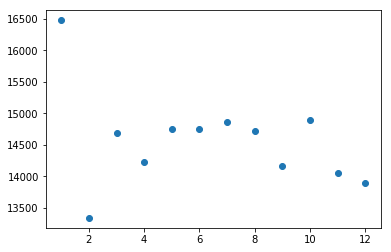

In [34]:
plt.scatter(X, y)

In [35]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()

In [36]:
model.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [37]:
print('Weight coefficients: ', model.coef_)
print('y-axis intercept: ', model.intercept_)

Weight coefficients:  [[-73.25874126]]
y-axis intercept:  [15040.01515152]


In [38]:
x_min = np.array([[X.min()]])
x_max = np.array([[X.max()]])
y_min = model.predict(x_min)
y_max = model.predict(x_max)

In [1]:
plt.scatter(X, y, c='blue')
plt.plot([x_min[0], x_max[0]], [y_min[0], y_max[0]], c='red')
plt.ylabel('Crime Count for 510-Auto Stolen')
plt.xlabel('Month')

NameError: name 'plt' is not defined

In [ ]:
#Prediction by Day of Week

In [85]:
week = model_df.groupby('dayofweek')
week = week['CrimeCode'].count()
week = week.reset_index()
week.head()

,dayofweek,CrimeCode
0,0,24874
1,1,24164
2,2,24607
3,3,24510
4,4,26608


In [86]:
X = week.dayofweek.values.reshape(-1, 1)
y = week.CrimeCode.values.reshape(-1, 1)

print("Shape: ", X.shape, y.shape)

Shape:  (7, 1) (7, 1)


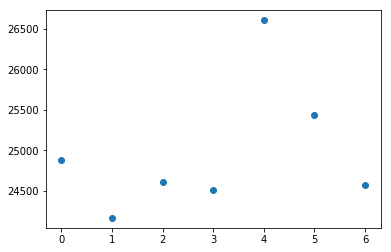

In [87]:
plt.scatter(X, y)

In [84]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()

In [44]:
model.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [45]:
print('Weight coefficients: ', model.coef_)
print('y-axis intercept: ', model.intercept_)

Weight coefficients:  [[129.60714286]]
y-axis intercept:  [24577.75]


In [46]:
x_min = np.array([[X.min()]])
x_max = np.array([[X.max()]])
y_min = model.predict(x_min)
y_max = model.predict(x_max)

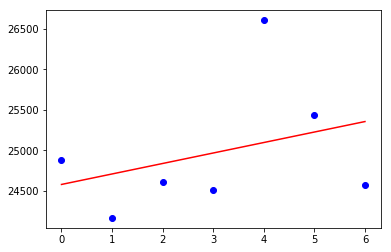

In [47]:
plt.scatter(X, y, c='blue')
plt.plot([x_min[0], x_max[0]], [y_min[0], y_max[0]], c='red')

In [199]:
data = data1[['month', 'CrimeCodeDescription','PremiseCode']].dropna()
#data = data.loc[data['CrimeCode'].isin(['510','210','420','230','626','740','310','440','330','624'])]
data.head()

,month,CrimeCodeDescription,PremiseCode
0,4,VEHICLE - STOLEN,101
1,2,VEHICLE - STOLEN,101
2,4,VEHICLE - STOLEN,101
3,4,VEHICLE - STOLEN,101
4,4,VEHICLE - STOLEN,101


In [217]:
data_encoded = pd.get_dummies(data, columns=["CrimeCodeDescription"])
data_encoded = data_encoded.fillna(0)
data_encoded = data_encoded.reset_index()
data_encoded.head()

,index,month,PremiseCode,CrimeCodeDescription_,CrimeCodeDescription_ABORTION/ILLEGAL,CrimeCodeDescription_ARSON,CrimeCodeDescription_ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER,"CrimeCodeDescription_ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",CrimeCodeDescription_ATTEMPTED ROBBERY,CrimeCodeDescription_BATTERY - SIMPLE ASSAULT,...,CrimeCodeDescription_UNAUTHORIZED COMPUTER ACCESS,"CrimeCodeDescription_VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)","CrimeCodeDescription_VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS) 0114",CrimeCodeDescription_VANDALISM - MISDEAMEANOR ($399 OR UNDER),CrimeCodeDescription_VEHICLE - ATTEMPT STOLEN,CrimeCodeDescription_VEHICLE - STOLEN,CrimeCodeDescription_VIOLATION OF COURT ORDER,CrimeCodeDescription_VIOLATION OF RESTRAINING ORDER,CrimeCodeDescription_VIOLATION OF TEMPORARY RESTRAINING ORDER,CrimeCodeDescription_WEAPONS POSSESSION/BOMBING
0,0,4,101,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,1,2,101,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,2,4,101,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,3,4,101,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,4,4,101,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [226]:
from sklearn.model_selection import train_test_split

X = data_encoded[['month', "PremiseCode"]]

X = pd.get_dummies(X, columns=["month"])
y = data_encoded["CrimeCodeDescription_ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT"].values.reshape(-1, 1)

# X_train, X_test, y_train, y_test= train_test_split(X, y, random_state=42)

# X_train.head()

In [225]:
# from sklearn.linear_model import LinearRegression
# model = LinearRegression()
# model.fit(X_train, y_train)
# plt.scatter(model.predict(X_train), model.predict(X_train) - y_train, c="blue", label="Training Data")
# plt.scatter(model.predict(X_test), model.predict(X_test) - y_test, c="orange", label="Testing Data")
# plt.legend()
# plt.hlines(y=0, xmin=y_test.min(), xmax=y_test.max())
# plt.title("Month Plot")
# plt.show()

In [227]:
from sklearn.preprocessing import LabelEncoder

# Step 1: Label-encode data set
label_encoder = LabelEncoder()
label_encoder.fit(y)
encoded_y = label_encoder.transform(y)

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:95: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:128: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [228]:
for label, original_class in zip(encoded_y, y):
    print('Original Class: ' + str(original_class))
    print('Encoded Label: ' + str(label))
    print('-' * 12)

Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [1]
Encoded Label: 1
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [1]
Encoded Label: 1
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0


Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]
Encoded Label: 0
------------
Original Class: [0]


In [229]:
from keras.utils import to_categorical

# Step 2: One-hot encoding
one_hot_y = to_categorical(encoded_y)
one_hot_y

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [1., 0.],
       [0., 1.]], dtype=float32)